# Obejct_detection

Writer: E.W

## Intro

In this notebook, I will detect african-wildlifes with YOLO v8. There are three jobs awaiting:
1. Organize the data for training and inferencing
2. Fine tuning YOLO V5n as the baseline model and YOLO v8m then check model performance
3. Display all or sepecific objects detected 

## Data Preprocessing

In [6]:
import os
import matplotlib.pyplot as plt
import numpy as np
import shutil
import cv2
import random

First, we need to prepare our data. The image data of this dataset is jpg and text data is formatted as YOLO asks. I don't need to do more changes on it but split them into train, validation and test.

In [19]:
# Creating paths for separate images and labels
curr_path=os.getcwd()
imgtrainpath = os.path.join(curr_path,'images','train')
imgvalpath=os.path.join(curr_path,'images','validation')
imgtestpath=os.path.join(curr_path,'images','test')

labeltrainpath=os.path.join(curr_path,'labels','train')
labelvalpath=os.path.join(curr_path,'labels','validation')
labeltestpath=os.path.join(curr_path,'labels','test')

# Creating directories for all paths defined
os.makedirs(imgtrainpath,exist_ok=True)
os.makedirs(imgvalpath,exist_ok=True)
os.makedirs(imgtestpath,exist_ok=True)
os.makedirs(labeltrainpath,exist_ok=True)
os.makedirs(labelvalpath,exist_ok=True)
os.makedirs(labeltestpath,exist_ok=True)

In [40]:
BASE_PATH = '/kaggle/input/african-wildlife'
IMAGE_SIZE = 640
for dirname in os.listdir(BASE_PATH):
    dirpath=os.path.join(BASE_PATH, dirname)
    for file in os.listdir(dirpath):
        filepath=os.path.join(dirpath, file)
        newname=dirname+'_'+file
        if file.endswith((".txt")): 
            shutil.copy(filepath, labeltrainpath)
            path=os.path.join(labeltrainpath, file)
            newpath=os.path.join(labeltrainpath, newname)
        elif file.endswith((".jpg", ".JPG")): 
            img_resized=cv2.resize(cv2.imread(filepath), (IMAGE_SIZE, IMAGE_SIZE))
            path=os.path.join(imgtrainpath, file)
            cv2.imwrite(path, img_resized)
            newpath=os.path.join(imgtrainpath, newname)
        os.rename(path, newpath) # Rename the file (label or image)

In [20]:
# Checking the size of train dataset
len(os.listdir(imgtrainpath)), len(os.listdir(labeltrainpath))

(1189, 1189)

There is one concern I have that there may be multiple objects in one image. They are perfect test images for the last job, object detection. So, the first thing to do is finding them and put it away.

In [ ]:
for file in os.listdir(labeltrainpath):
    classes_set=set()
    with open(os.path.join(labeltrainpath, file), "r") as f:
        for line in f:
            class_id,_,_,_,_=line.strip().split(" ")
            classes_set.add(class_id)
    if len(classes_set) > 1:
        filepath=os.path.join(labeltrainpath, file)
        newpath=os.path.join(labeltestpath, file)
        shutil.move(filepath, newpath) # moving label file to test path
        basename=os.path.splitext(file)[0]
        print(basename) # printing the image name
        imgfilename=basename+'.jpg'
        oldimgfilepath=os.path.join(imgtrainpath, imgfilename)
        newimgfilepath=os.path.join(imgtestpath, imgfilename) 
        shutil.move(oldimgfilepath, newimgfilepath) # moving image to test path

In [21]:
# Checking the size of test dataset
len(os.listdir(imgtestpath)), len(os.listdir(labeltestpath))

(18, 18)

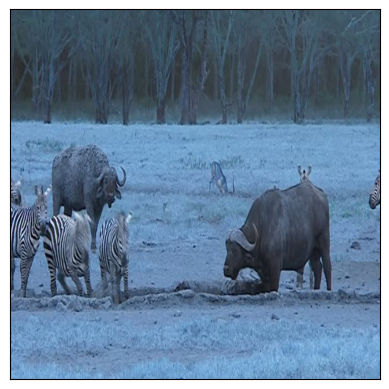

In [7]:
# Pick one image to show
plt.imshow(cv2.imread('/kaggle/working/images/test/buffalo_297.jpg')) 
plt.xticks([])
plt.yticks([])
plt.show()

In [ ]:
# train/validation dataset split

factor=0.2 

for file in random.sample(os.listdir(imgtrainpath), int(len(os.listdir(imgtrainpath))*factor)):
    basename=os.path.splitext(file)[0]
    textfilename=basename+'.txt'
    labelfilepath=os.path.join(labeltrainpath, textfilename)
    labeldestpath=os.path.join(labelvalpath, textfilename)
    imgfilepath=os.path.join(imgtrainpath, file)
    imgdestpath=os.path.join(imgvalpath, file)
    shutil.move(imgfilepath, imgdestpath)
    shutil.move(labelfilepath, labeldestpath)

In [22]:
# Checking the size of validation dataset
len(os.listdir(imgvalpath)), len(os.listdir(labelvalpath))

(297, 297)

## Modeling

In [10]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.7/793.7 kB 20.4 MB/s eta 0:00:0000:01


## Baseline -- YOLO V5

In [41]:
from ultralytics import YOLO
# Using YOLO's pretrained model architecture and weights for training
model=YOLO('yolov5n.yaml').load('yolov5n.pt')

PRO TIP 💡 Replace 'model=yolov5n.pt' with new 'model=yolov5nu.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 5.31M/5.31M [00:00<00:00, 93.5MB/s]

Transferred 427/427 items from pretrained weights


In [25]:
config_content = f"""
train: {imgtrainpath}
val: {imgvalpath}
test: {imgtestpath}

nc: 4

names:
  0: buffle
  1: elephant
  2: rhino
  3: zebra
"""

# Write the configuration to the file
with open("african_wildlife.yaml", "w") as f:
    f.write(config_content)

In [42]:
config_path = '/kaggle/working/african_wildlife.yaml'
model.train(data=config_path, epochs=20, 
            imgsz=640, name='african_wildlife_detection_V5n')

Ultralytics YOLOv8.2.48 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov5n.yaml, data=/kaggle/working/african_wildlife.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=african_wildlife_detection_V5n, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fa

2024-07-01 09:18:56,144	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-07-01 09:18:56,912	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1      1760  ultralytics.nn.modules.conv.Conv             [3, 16, 6, 2, 2]              
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      4800  ultralytics.nn.modules.block.C3              [32, 32, 1]                   
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     29184  ultralytics.nn.modules.block.C3              [64, 64, 2]                   
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  3    156928  ultralytics.nn.modules.block.C3              [128, 128, 3]                 
  7                  -1  1    295424  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.24.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...
AMP: checks passed ✅


train: Scanning /kaggle/working/labels/train.cache... 1189 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1189/1189 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/labels/validation.cache... 297 images, 0 backgrounds, 0 corrupt: 100%|██████████| 297/297 [00:00<?, ?it/s]


Plotting labels to runs/detect/african_wildlife_detection_V5n/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/african_wildlife_detection_V5n
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.33G     0.9325      2.317      1.348         21        640: 100%|██████████| 75/75 [00:17<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.17it/s]


                   all        297        555      0.697      0.582      0.749      0.524

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.34G     0.9676      1.648      1.353         22        640: 100%|██████████| 75/75 [00:14<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.60it/s]

                   all        297        555      0.764      0.627      0.748      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      2.33G      1.009      1.593      1.379         24        640: 100%|██████████| 75/75 [00:14<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.65it/s]

                   all        297        555      0.721       0.68      0.738       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.33G      1.015      1.519      1.385         18        640: 100%|██████████| 75/75 [00:13<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.86it/s]

                   all        297        555      0.676      0.632      0.699      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.33G      1.025      1.441      1.382         10        640: 100%|██████████| 75/75 [00:13<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.87it/s]

                   all        297        555       0.68      0.709      0.777      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      2.33G     0.9516      1.244      1.314         20        640: 100%|██████████| 75/75 [00:13<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.88it/s]

                   all        297        555      0.775      0.813       0.86      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      2.33G     0.9424      1.226      1.323         21        640: 100%|██████████| 75/75 [00:14<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.00it/s]

                   all        297        555      0.818      0.638      0.747      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.33G     0.9234      1.138       1.31         22        640: 100%|██████████| 75/75 [00:13<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.14it/s]

                   all        297        555      0.855      0.809      0.881      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.32G     0.8857      1.087       1.29          8        640: 100%|██████████| 75/75 [00:13<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.10it/s]

                   all        297        555      0.865      0.798       0.88      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.33G     0.8817      1.044      1.288         14        640: 100%|██████████| 75/75 [00:13<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.08it/s]

                   all        297        555      0.875      0.821      0.912      0.686


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.33G     0.8055     0.9335      1.281         12        640: 100%|██████████| 75/75 [00:15<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.68it/s]

                   all        297        555      0.883       0.86      0.919      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.33G     0.7635     0.8361      1.241          8        640: 100%|██████████| 75/75 [00:13<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.33it/s]

                   all        297        555      0.865       0.85      0.922      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.32G     0.7338     0.7959      1.213          7        640: 100%|██████████| 75/75 [00:13<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.06it/s]

                   all        297        555      0.914      0.831      0.928       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.33G     0.6889     0.7395      1.177          8        640: 100%|██████████| 75/75 [00:13<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.94it/s]

                   all        297        555      0.892       0.85      0.927      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      2.33G     0.6607     0.6885      1.157          7        640: 100%|██████████| 75/75 [00:13<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.01it/s]

                   all        297        555      0.884        0.9      0.946      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      2.33G     0.6494     0.6443      1.136         14        640: 100%|██████████| 75/75 [00:13<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.94it/s]

                   all        297        555      0.919      0.899      0.958      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      2.32G     0.6228     0.6257      1.123          9        640: 100%|██████████| 75/75 [00:13<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.09it/s]

                   all        297        555        0.9      0.897      0.944      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.33G     0.6049     0.5903      1.115          7        640: 100%|██████████| 75/75 [00:13<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.97it/s]

                   all        297        555      0.944      0.863      0.951      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      2.33G     0.5931      0.555      1.105          7        640: 100%|██████████| 75/75 [00:13<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.08it/s]

                   all        297        555      0.933      0.902      0.958      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      2.33G     0.5711     0.5291      1.082          8        640: 100%|██████████| 75/75 [00:13<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.99it/s]

                   all        297        555      0.947       0.91      0.962      0.782



20 epochs completed in 0.096 hours.
Optimizer stripped from runs/detect/african_wildlife_detection_V5n/weights/last.pt, 5.3MB
Optimizer stripped from runs/detect/african_wildlife_detection_V5n/weights/best.pt, 5.3MB

Validating runs/detect/african_wildlife_detection_V5n/weights/best.pt...
Ultralytics YOLOv8.2.48 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
YOLOv5n summary (fused): 193 layers, 2503724 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.65it/s]


                   all        297        555      0.946       0.91      0.962      0.782
                buffle         65         88      0.973      0.955      0.975      0.819
              elephant         73        159      0.931      0.868      0.948      0.736
                 rhino         75        117      0.973      0.938      0.983      0.848
                 zebra         84        191      0.908       0.88      0.943      0.724
Speed: 0.2ms preprocess, 1.8ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/african_wildlife_detection_V5n


lr/pg0,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg1,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
lr/pg2,▃▆██▇▇▆▆▆▅▅▄▄▃▃▃▂▂▁▁
metrics/mAP50(B),▂▂▂▁▃▅▂▆▆▇▇▇▇▇██████
metrics/mAP50-95(B),▂▂▁▁▂▄▁▄▅▆▆▆▆▇▇▇▇▇██
metrics/precision(B),▂▃▂▁▁▄▅▆▆▆▆▆▇▇▆▇▇███
metrics/recall(B),▁▂▃▂▄▆▂▆▆▆▇▇▆▇███▇██
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇▇███▇▇▆▆▆▅▄▄▃▂▂▂▂▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f721aac4580>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [23]:
def evaluate_map50(trainedmodel, data_path, dataset='val'):
    metrics=trainedmodel.val(data=data_path, split=dataset)
    map50=round(metrics.box.map50, 3)
    print("The mAP of model for all images on {0} dataset is {1}".format(dataset,map50))
    return metrics, map50

In [43]:
# Evaluating val metrics
val_metrics, val_map50=evaluate_map50(model, config_path, dataset='val')

Ultralytics YOLOv8.2.48 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
YOLOv5n summary (fused): 193 layers, 2503724 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/labels/validation.cache... 297 images, 0 backgrounds, 0 corrupt: 100%|██████████| 297/297 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:04<00:00,  4.33it/s]


                   all        297        555      0.948       0.91      0.962      0.783
                buffle         65         88      0.974      0.955      0.975      0.821
              elephant         73        159      0.931      0.868      0.948      0.737
                 rhino         75        117      0.973      0.938      0.983      0.851
                 zebra         84        191      0.913       0.88      0.943      0.724
Speed: 0.2ms preprocess, 3.1ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/african_wildlife_detection_V5n2
The mAP of model for all images on val dataset is 0.962


The map50 result is good, it shows that the model has a good perfomance. It achieves high precision (0.948) and recall (0.91), indicating accurate detection and comprehensive coverage of objects.

## YOLO V8

In [11]:
from ultralytics import YOLO
# Using YOLO's pretrained model architecture and weights for training
model=YOLO('yolov8m.yaml').load('yolov8m.pt')

Transferred 475/475 items from pretrained weights


In [26]:
# Training the model
config_path = '/kaggle/working/african_wildlife.yaml'
model.train(data=config_path, epochs=100, 
            imgsz=640, batch=16, name='african_wildlife_detection')

In [44]:
# Evaluating val metrics
MODEL_PATH = '/kaggle/working/runs/detect/african_wildlife_detection/weights/best.pt'
model = YOLO(MODEL_PATH)
val_metrics, val_map50=evaluate_map50(model, config_path, dataset='val')

Ultralytics YOLOv8.2.48 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
YOLOv8m summary (fused): 218 layers, 25842076 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/labels/validation.cache... 297 images, 0 backgrounds, 0 corrupt: 100%|██████████| 297/297 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        297        555      0.952      0.896      0.958      0.829
                buffle         65         88      0.987      0.932      0.961      0.872
              elephant         73        159      0.939      0.849      0.939      0.771
                 rhino         75        117      0.965      0.953      0.979      0.897
                 zebra         84        191      0.916      0.852      0.953      0.775
Speed: 0.2ms preprocess, 11.2ms inference, 0.0ms loss, 5.2ms postprocess per image
Results saved to runs/detect/val2
The mAP of model for all images on val dataset is 0.958


The map50 result is good, it shows that the model has a good perfomance. It achieves high precision (0.952) and recall (0.896), indicating accurate detection and comprehensive coverage of objects. The class buffle and rhino exhibit exceptional detection performance with high precision, recall, and mAP scores but for the other two the result is not as good, they can be used to test model in the last job

In [28]:
# function for displaying plots created by YOLO
def display_curves(root_path):
    plt.figure(figsize=(50,50))
    
    #displaying p curve
    p_curve=cv2.imread(os.path.join(root_path,'P_curve.png'))
    ax=plt.subplot(5,1,1)
    plt.imshow(p_curve)
    
    #displaying r curve
    r_curve=cv2.imread(os.path.join(root_path,'R_curve.png'))
    ax=plt.subplot(5,1,2)
    plt.imshow(r_curve)
    
    #displaying pr curve
    pr_curve=cv2.imread(os.path.join(root_path,'PR_curve.png'))
    ax=plt.subplot(5,1,3)
    plt.imshow(pr_curve)
    
    #displaying f1 curve
    f1_curve=cv2.imread(os.path.join(root_path,'F1_curve.png'))
    ax=plt.subplot(5,1,4)
    plt.imshow(f1_curve)
    
    #displaying confusion matrix
    confusion_matrix=cv2.imread(os.path.join(root_path,'confusion_matrix.png'))
    ax=plt.subplot(5,1,5)
    plt.imshow(confusion_matrix)

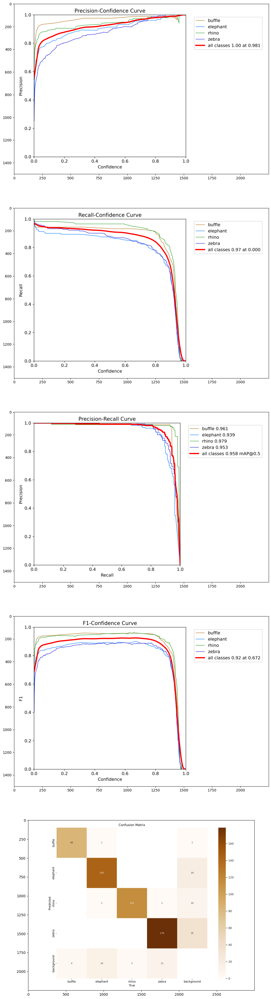

In [29]:
val_path=os.path.join(curr_path, 'runs', 'detect', 'african_wildlife_detection2') 
display_curves(val_path) 

Clearly, these plots prove the conclusion we got.

In [38]:
# Class mapping
label_dict = {"buffle":0,"elephant":1,"rhino":2,"zebra":3}

# Display the obeject detection box
def plot_actual_and_predictions(imgtestpath, model, animal=None):
    plt.figure(figsize=(30, 30))
    test_images = [f for f in os.listdir(imgtestpath)]
    m = random.randint(0, len(test_images) - 1)  # Selecting random image number from the test dataset
    label_id = label_dict[animal] if animal else None
    for i in range(1, 6, 2):
        test_image = os.path.join(imgtestpath, test_images[m])
        ax = plt.subplot(3, 2, i)

        # Display actual image
        plt.imshow(cv2.imread(test_image)) 
        plt.xticks([])
        plt.yticks([])
        plt.title("Actual image", fontsize=40)

        #Make predictionm classes are specified the animal we want to predict
#         MODEL_PATH = '/kaggle/working/runs/detect/african_wildlife_detection/weights/best.pt'
#         model = YOLO(MODEL_PATH)
        res = model(test_image,classes = label_id)
        res_plotted = res[0].plot()
        ax = plt.subplot(3, 2, i + 1)

        # Display image with predictions
        plt.imshow(res_plotted)
        plt.title("Image with predictions", fontsize=40)
        plt.xticks([])
        plt.yticks([])

        m = (m + 1) % len(test_images)  # Ensure the index stays within range

    plt.show()


image 1/1 /kaggle/working/images/test/buffalo_299.jpg: 640x640 1 zebra, 15.4ms
Speed: 1.5ms preprocess, 15.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/rhino_238.jpg: 640x640 (no detections), 15.5ms
Speed: 1.5ms preprocess, 15.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/images/test/elephant_290.jpg: 640x640 3 zebras, 15.4ms
Speed: 1.6ms preprocess, 15.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


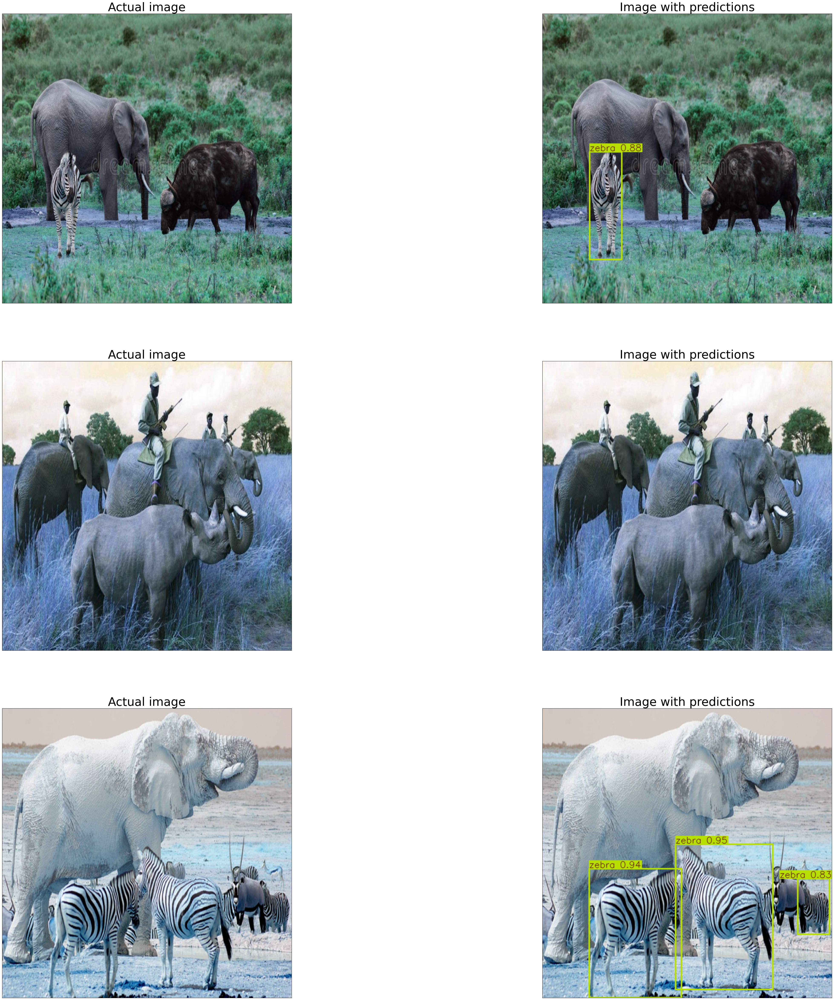

In [37]:
plot_actual_and_predictions(imgtestpath, model,animal = "zebra")

## Script


0: 640x640 1 buffle, 15.2ms
Speed: 1.7ms preprocess, 15.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


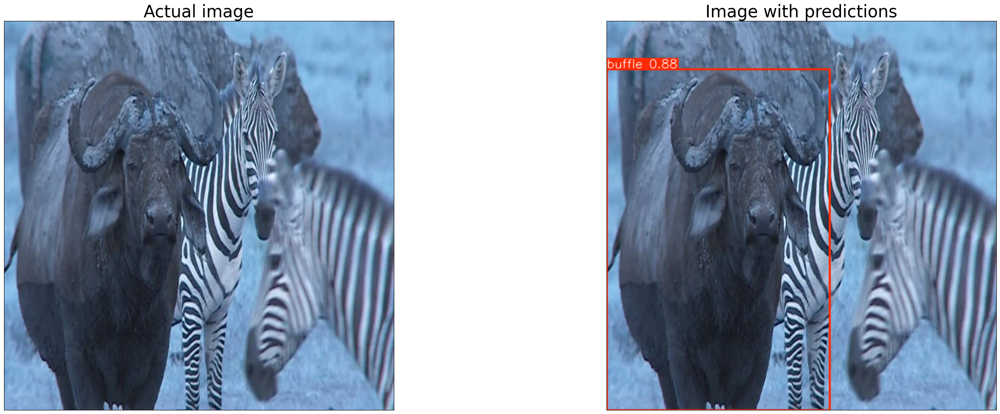

In [39]:
def load_image(image_path):
    # Load the input image
    image = cv2.imread(image_path)
    return image

def predict_and_plot(image_path, model_path,animal=None):
    plt.figure(figsize=(30, 30))
    label_id = label_dict[animal] if animal else None
    ax = plt.subplot(3, 2, 1)
    # Display actual image
    image = cv2.imread(image_path)
    plt.imshow(image) 
    plt.xticks([])
    plt.yticks([])
    plt.title("Actual image", fontsize=30)
    #Make predictionm classes are specified the animal we want to predict
    model = YOLO(MODEL_PATH)
    res = model(image,classes = label_id)
    res_plotted = res[0].plot()
    ax = plt.subplot(3, 2, 2)
    # Display image with predictions
    plt.imshow(res_plotted)
    plt.title("Image with predictions", fontsize=30)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

if __name__ == "__main__":
    MODEL_PATH = '/kaggle/working/runs/detect/african_wildlife_detection/weights/best.pt'
    IMAGE_PATH = '/kaggle/working/images/test/buffalo_301.jpg'
    predict_and_plot(IMAGE_PATH, MODEL_PATH,animal = 'buffle')
    

## Conclusion

The two different models(V5n and V8m) have the similar permformance but the state-of-art model doesn't beat the older model. The reason may be the dataset is a simple and small dataset and it doesn't need complicated achitecture and large parameters for training. However, this experiment shows that both models can complete the object detection job.